In [ ]:
!pip install unidecode
import pandas as pd
import numpy as np
import re
import unidecode
import warnings

from sklearn.model_selection import train_test_split
from keras.layers import LSTM, Dense, TimeDistributed, Embedding, Input
from keras.models import Model, load_model
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.preprocessing.sequence import pad_sequences

warnings.filterwarnings('ignore')

     |████████████████████████████████| 245kB 8.3MB/s 


Using TensorFlow backend.


In [ ]:
def open_file(filename):

  with open(filename, mode='rt', encoding='utf-8') as f:
    text = f.read()
  
  return text

text = open_file('/content/drive/My Drive/ML_Data/spa.txt')
text

'Go.\tVe.\tCC-BY 2.0 (France) Attribution: tatoeba.org #2877272 (CM) & #4986655 (cueyayotl)\nGo.\tVete.\tCC-BY 2.0 (France) Attribution: tatoeba.org #2877272 (CM) & #4986656 (cueyayotl)\nGo.\tVaya.\tCC-BY 2.0 (France) Attribution: tatoeba.org #2877272 (CM) & #4986657 (cueyayotl)\nGo.\tVáyase.\tCC-BY 2.0 (France) Attribution: tatoeba.org #2877272 (CM) & #6586271 (arh)\nHi.\tHola.\tCC-BY 2.0 (France) Attribution: tatoeba.org #538123 (CM) & #431975 (Leono)\nRun!\t¡Corre!\tCC-BY 2.0 (France) Attribution: tatoeba.org #906328 (papabear) & #1685404 (Elenitigormiti)\nRun!\t¡Corran!\tCC-BY 2.0 (France) Attribution: tatoeba.org #906328 (papabear) & #5213896 (cueyayotl)\nRun!\t¡Corra!\tCC-BY 2.0 (France) Attribution: tatoeba.org #906328 (papabear) & #8005613 (Seael)\nRun!\t¡Corred!\tCC-BY 2.0 (France) Attribution: tatoeba.org #906328 (papabear) & #8005615 (Seael)\nRun.\tCorred.\tCC-BY 2.0 (France) Attribution: tatoeba.org #4008918 (JSakuragi) & #6681472 (arh)\nWho?\t¿Quién?\tCC-BY 2.0 (France) At

In [ ]:
data = [i.split('\t') for i in text.strip().split('\n')]
data = np.array(data)

In [ ]:
df = pd.DataFrame({"spanish": data[:, 1], "english":data[:, 0]})
df.head()

,spanish,english
0,Ve.,Go.
1,Vete.,Go.
2,Vaya.,Go.
3,Váyase.,Go.
4,Hola.,Hi.


In [ ]:
def clean_text(sentence):
  sentence = sentence.lower()
  sentence = unidecode.unidecode(sentence)
  sentence = re.sub("'", '', sentence)
  sentence = re.sub('[^a-zA-Z]', ' ', sentence).split()
  sentence = " ".join(sentence)

  return sentence

df["cleaned_spanish"] = df["spanish"].apply(lambda x : clean_text(x))
df["cleaned_english"] = df["english"].apply(lambda x : clean_text(x))

In [ ]:
df.head()

,spanish,english,cleaned_spanish,cleaned_english
0,Ve.,Go.,ve,go
1,Vete.,Go.,vete,go
2,Vaya.,Go.,vaya,go
3,Váyase.,Go.,vayase,go
4,Hola.,Hi.,hola,hi


In [ ]:
spa_tr, spa_tst, eng_tr, eng_tst = train_test_split(df["cleaned_spanish"], df["cleaned_english"], test_size=0.2, random_state=42)

In [ ]:
spanish_vocab_freq  = {}
for i in spa_tr:
  for j in i.split():
    try:
      spanish_vocab_freq[j] += 1
    except KeyError:
      spanish_vocab_freq[j] = 1

spanish_vocab_freq

In [ ]:
english_vocab_freq = {}

for i in eng_tr:
  for j in i.split():
    try:
      english_vocab_freq[j] += 1
    except KeyError:
      english_vocab_freq[j] = 1

english_vocab_freq

In [ ]:
thresold = 2
cnt = 0
tot_cnt = 0
freq = 0
tot_freq = 0

for key, val in english_vocab_freq.items():
  tot_cnt += 1
  tot_freq += val

  if(val < thresold):
    cnt += 1
    freq += 1

print("% of less frequent english words in vocab", cnt/tot_cnt)
print("% of less frequent english words contribution in vocab", freq/tot_freq)



% of less frequent english words in vocab 0.3347942537131726
% of less frequent english words contribution in vocab 0.006612261778241571


In [ ]:
thresold = 2
cnt = 0
tot_cnt = 0
freq = 0
tot_freq = 0

for key, val in spanish_vocab_freq.items():
  tot_cnt += 1
  tot_freq += val

  if(val < thresold):
    cnt += 1
    freq += 1

print("% of less frequent english words in vocab", cnt/tot_cnt)
print("% of less frequent english words contribution in vocab", freq/tot_freq)



% of less frequent english words in vocab 0.4173833724263748
% of less frequent english words contribution in vocab 0.015995245871348884


In [ ]:
spanish_vocab_dic = {}
cnt = 2
for key, val in spanish_vocab_freq.items():
  if(val >= thresold):
    spanish_vocab_dic[key] = cnt
    cnt += 1

spanish_vocab_dic['<pad>'] = 0
spanish_vocab_dic['<unk>'] = 1

In [ ]:
english_vocab_dic = {}
cnt = 4
for key, val in english_vocab_freq.items():
  if(val >= thresold):
    english_vocab_dic[key] = cnt
    cnt += 1

english_vocab_dic['<pad>'] = 0
english_vocab_dic['<unk>'] = 1

In [ ]:
eng_seq = []
target_vocab = [key for key, val in english_vocab_freq.items()]
target_vocab
for i in eng_tr:
  sentence = []
  for j in i.split():
    if(j not in target_vocab):
      sentence.append(english_vocab_dic['<unk>'])
    elif(english_vocab_freq[j] < thresold):
      sentence.append(english_vocab_dic['<unk>'])
    else:
      sentence.append(english_vocab_dic[j])
  eng_seq.append(sentence)


In [ ]:
eng_valid_seq = []
for i in eng_tst:
  sentence = []
  for j in i.split():
    if(j not in target_vocab):
      sentence.append(english_vocab_dic['<unk>'])
    elif(english_vocab_freq[j] < thresold):
      sentence.append(english_vocab_dic['<unk>'])
    else:
      sentence.append(english_vocab_dic[j])
  eng_valid_seq.append(sentence)


In [ ]:
spa_seq = []
target_vocab = [key for key, val in spanish_vocab_freq.items()]
target_vocab
for i in spa_tr:
  sentence = []
  for j in i.split():
    if(j not in target_vocab):
      sentence.append(spanish_vocab_dic['<unk>'])
    elif(spanish_vocab_freq[j] < thresold):
      sentence.append(spanish_vocab_dic['<unk>'])
    else:
      sentence.append(spanish_vocab_dic[j])
  spa_seq.append(sentence)
spa_seq

In [ ]:
spa_valid_seq = []
for i in spa_tst:
  sentence = []
  for j in i.split():
    if(j not in target_vocab):
      sentence.append(spanish_vocab_dic['<unk>'])
    elif(spanish_vocab_freq[j] < thresold):
      sentence.append(spanish_vocab_dic['<unk>'])
    else:
      sentence.append(spanish_vocab_dic[j])
  spa_valid_seq.append(sentence)


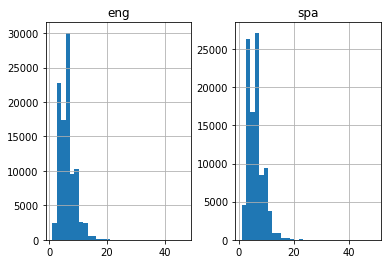

In [ ]:
import matplotlib.pyplot as plt

%matplotlib inline

spa_word_len = []
eng_word_len = []

for i in spa_seq:
  spa_word_len.append(len(i))

for j in eng_seq:
  eng_word_len.append(len(j))

length_df = pd.DataFrame({"eng": eng_word_len, "spa": spa_word_len})

length_df.hist(bins=30)
plt.show()

In [ ]:
spa_seq = pad_sequences(spa_seq, maxlen=15, truncating='post', padding='post')

In [ ]:
eng_seq = pad_sequences(eng_seq, maxlen=15, truncating='post', padding='post')
eng_seq

array([[   4,    5,    6, ...,    0,    0,    0],
       [   1,   10,    8, ...,    0,    0,    0],
       [  16,   17,   18, ...,    0,    0,    0],
       ...,
       [2153,  667,    0, ...,    0,    0,    0],
       [   4,  503,  870, ...,    0,    0,    0],
       [ 332,    8,  982, ..., 2805,  262,    0]], dtype=int32)

In [ ]:
spa_valid_seq = pad_sequences(spa_valid_seq, maxlen=15, truncating='post', padding='post')
eng_valid_seq = pad_sequences(eng_valid_seq, maxlen=15, truncating='post', padding='post')

In [ ]:
english_vocab_dic['<start>'] = 2
english_vocab_dic['<end>'] = 3

y_tr = []

for i in eng_seq:
  temp = np.insert(i, 0, english_vocab_dic['<start>'])
  y_tr.append(temp)
y_tr_eng = []
for i in y_tr:
  if(0 in list(i)):
    temp = np.insert(i, list(i).index(0), english_vocab_dic['<end>'])
  else:
    temp = np.insert(i, len(i), english_vocab_dic['<end>'])
  y_tr_eng.append(temp)

y_tr_eng = np.array(y_tr_eng)

In [ ]:
y_val_tr = []

for i in eng_valid_seq:
  temp = np.insert(i, 0, english_vocab_dic['<start>'])
  y_val_tr.append(temp)

y_val_tr_eng = []
for i in y_val_tr:
  if(0 in list(i)):
    temp = np.insert(i, list(i).index(0), english_vocab_dic['<end>'])
  else:
    temp = np.insert(i, len(i), english_vocab_dic['<end>'])
  y_val_tr_eng.append(temp)

y_val_tr_eng = np.array(y_val_tr_eng)

In [ ]:
max_spa_len = 15
max_eng_len = 17

In [ ]:
latent_dim = 150

embedding_dim = 200

In [ ]:
x_voc = len(spanish_vocab_dic)
y_voc = len(english_vocab_dic)

In [ ]:
enc_inputs = Input(shape=(max_spa_len, ))
enc_emb = Embedding(x_voc, embedding_dim, trainable=True)(enc_inputs)
enc_lstm = LSTM(latent_dim, return_sequences=True, return_state=True)
enc_output, state_h, state_c = enc_lstm(enc_emb)

In [ ]:
dec_inputs = Input(shape=(max_eng_len-1, ))
dec_emb = Embedding(y_voc, embedding_dim, trainable=True)
dec_emb_layer = dec_emb(dec_inputs)
dec_lstm = LSTM(latent_dim, return_sequences=True, return_state=True)
dec_output, dec_h, dec_c = dec_lstm(dec_emb_layer, initial_state = [state_h, state_c])

dec_dense = TimeDistributed(Dense(y_voc, activation='softmax'))
dec_outputs = dec_dense(dec_output)

In [ ]:
model = Model([enc_inputs, dec_inputs], dec_outputs)

model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 15)           0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 16)           0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 15, 200)      2683000     input_1[0][0]                    
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 16, 200)      1640000     input_2[0][0]                    
____________________________________________________________________________________________

In [ ]:
model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy')

In [ ]:
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3, min_delta=0.0001)
mc = ModelCheckpoint('best_model_v4.h5', monitor='val_loss', mode='min', save_best_only=True, verbose=1)

In [ ]:
history = model.fit([spa_seq, y_tr_eng[:, :-1]], y_tr_eng.reshape(y_tr_eng.shape[0], y_tr_eng.shape[1], 1)[:,1:], batch_size=512, epochs=100, callbacks=[es, mc],  validation_data=([spa_valid_seq, y_val_tr_eng[:, :-1]], y_val_tr_eng.reshape(y_val_tr_eng.shape[0], y_val_tr_eng.shape[1], 1)[:, 1:]))

In [ ]:
model = load_model('/content/best_model_v4.h5')
model.save_weights('best_model_weights_v4.h5')

In [ ]:
reverse_target_word_index = dict((val, key) for key, val in english_vocab_dic.items())
reverse_source_word_index = dict((val, key) for key, val in spanish_vocab_dic.items())

In [ ]:
encoder_model = Model(enc_inputs, [enc_output, state_h, state_c])

decoded_state_h = Input(shape=(latent_dim, ))
decoded_state_c = Input(shape=(latent_dim, ))

decode_input = Input(shape=(None, ))
decode_embedded = dec_emb(decode_input)
decode_output, decode_h, decode_c = dec_lstm(decode_embedded, initial_state=[decoded_state_h, decoded_state_c])

decode_output_2 = dec_dense(decode_output)

decoder_model = Model(
    [decode_input] + [decoded_state_h, decoded_state_c],
    [decode_output_2] + [decode_h, decode_c]
)


In [ ]:
def decode_sequence(input_seq):
  en_out, en_h, en_c = encoder_model.predict(input_seq)

  target_seq = np.zeros((1, 1))

  target_seq[0, 0] = english_vocab_dic['<start>']

  stop_condition = False
  decoded_sentence = ''

  while not stop_condition:
    output_token, e_h, e_c = decoder_model.predict([target_seq] + [en_h , en_c])
    sample_token_index = np.argmax(output_token[0, -1, :])
    sample_token = reverse_target_word_index[sample_token_index]
    print(sample_token)
    
    if(sample_token != '<end>'):
      decoded_sentence = decoded_sentence + sample_token + ' '

    if((sample_token == '<end>') or (len(decoded_sentence.split()) >= max_eng_len-1 )):
      stop_condition = True
    
    target_seq = np.zeros((1, 1))
    target_seq[0, 0] = sample_token_index

    eh_h, eh_c = e_h, e_c

  return decoded_sentence


In [ ]:
# target = y_val_original[15000:15050].tolist()
source = spa_tst[152:153].tolist()
target = eng_tst[152:153].tolist()

predicted = []

for i in spa_valid_seq[152:153]:
  predicted.append(decode_sequence(i.reshape(1, max_spa_len)))

df=pd.DataFrame({"Source":source,"Target":target,"predicted":predicted})
df

she
is
she
is
she
is
she
is
she
is
she
is
she
is
she
is


,Source,Target,predicted
0,ella sera la primera mujer japonesa astronauta,she will be the first japanese woman astronaut,she is she is she is she is she is she is she ...
